# Sequential NLP Project

# PART ONE

## Domain:
Digital content and entertainment industry

## Context:
The objective of this project is to build a text classification model that
analyses the customer's sentiments based on their reviews in the IMDB database. The model uses a complex deep learning model to build an embedding layer followed by a classification algorithm to analyse the sentiment of the customers.

## Data Description:
The Dataset of 50,000 movie reviews from IMDB, labelled by
sentiment (positive/negative). Reviews have been preprocessed, and each review is encoded as a sequence of word indexes (integers). For convenience, the words are indexed by their frequency in the dataset, meaning the for that has index 1 is the most frequent word. Use the first 20 words from each review to speed up training, using a max vocabulary size of 10,000. As a convention, "0" does not stand for a specific word, but instead is used to encode any unknown word.

## Project Objective:
Build a sequential NLP classifier which can use input text parameters to determine the customer sentiments.

# Digital content and entertainment industry

## 1. Import and analyse the data set.

In [1]:
import numpy as np
import pandas as pd

In [2]:
#loading imdb data with most frequent 10000 words

from keras.datasets import imdb
(X_train, y_train), (X_test, y_test) = imdb.load_data(num_words=10000)

17473536/17464789 [==============================] - 0s 0us/step


In [3]:
X_train.shape

(25000,)

In [4]:
X_test.shape

(25000,)

## 2. Perform relevant sequence adding on the data

In [5]:
def vectorize(sequences, dimension = 10000):
    results = np.zeros((len(sequences), dimension))
    for i, sequence in enumerate(sequences):
        results[i, sequence] = 1
    return results

In [6]:
#consolidating data for EDA
data = np.concatenate((X_train, X_test), axis=0)
label = np.concatenate((y_train, y_test), axis=0)

In [7]:
print("Categories:", np.unique(label))
print("Number of unique words:", len(np.unique(np.hstack(data))))

Categories: [0 1]
Number of unique words: 9998


In [8]:
length = [len(i) for i in data]
print("Average Review length:", np.mean(length))
print("Standard Deviation:", round(np.std(length)))

Average Review length: 234.75892
Standard Deviation: 173


## 3. Perform following data analysis:

### A. Print shape of features and labels

In [9]:
label.shape

(50000,)

In [10]:
data.shape

(50000,)

### B. Print value of any one feature and it's label

In [11]:
print("Label:", label[0])

Label: 1


In [12]:
print(data[0])

[1, 14, 22, 16, 43, 530, 973, 1622, 1385, 65, 458, 4468, 66, 3941, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 4536, 1111, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2025, 19, 14, 22, 4, 1920, 4613, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 1247, 4, 22, 17, 515, 17, 12, 16, 626, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2223, 5244, 16, 480, 66, 3785, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 1415, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 5952, 15, 256, 4, 2, 7, 3766, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 2, 1029, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2071, 56, 26, 141, 6, 194, 7486, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 5535, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 1334, 88, 12, 16, 283, 5, 16, 4472, 113, 103, 32, 15, 16, 5345, 19, 178, 32]


## 4. Decode the feature value to get original sentence

In [13]:
index = imdb.get_word_index()
reverse_index = dict([(value, key) for (key, value) in index.items()]) 
decoded = " ".join( [reverse_index.get(i - 3, "#") for i in data[0]] )
print(decoded) 

1654784/1641221 [==============================] - 0s 0us/step
# this film was just brilliant casting location scenery story direction everyone's really suited the part they played and you could just imagine being there robert # is an amazing actor and now the same being director # father came from the same scottish island as myself so i loved the fact there was a real connection with this film the witty remarks throughout the film were great it was just brilliant so much that i bought the film as soon as it was released for # and would recommend it to everyone to watch and the fly fishing was amazing really cried at the end it was so sad and you know what they say if you cry at a film it must have been good and this definitely was also # to the two little boy's that played the # of norman and paul they were just brilliant children are often left out of the # list i think because the stars that play them all grown up are such a big profile for the whole film but these children are amaz

In [14]:
#Adding sequence to data
data = vectorize(data)
label = np.array(label).astype("float32")

In [15]:
label

array([1., 0., 0., ..., 0., 0., 0.], dtype=float32)

### Distribution of data

In [16]:
#To plot for EDA
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline

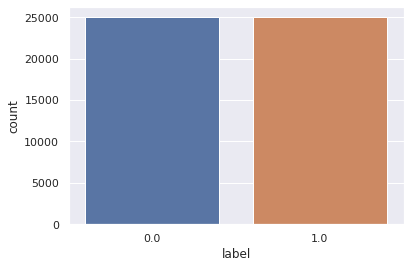

In [17]:
labelDF=pd.DataFrame({'label':label})
sns.countplot(x='label', data=labelDF)

**For above analysis it is clear that data has equal distribution of sentiments.This will help us building a good model.**

**Creating train and test data set**

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data,label, test_size=0.30, random_state=1)

In [19]:
X_train.shape

(35000, 10000)

In [20]:
X_test.shape

(15000, 10000)

## 5. Design, train, tune and test a sequential model.

In [21]:
from keras import models
from keras import layers

In [22]:
model = models.Sequential()
# Input - Layer
model.add(layers.Dense(50, activation = "relu", input_shape=(10000, )))
# Hidden - Layers
model.add(layers.Dropout(0.3, noise_shape=None, seed=None))
model.add(layers.Dense(50, activation = "relu"))
model.add(layers.Dropout(0.2, noise_shape=None, seed=None))
model.add(layers.Dense(50, activation = "relu"))
# Output- Layer
model.add(layers.Dense(1, activation = "sigmoid"))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                500050    
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dropout_1 (Dropout)         (None, 50)                0         
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 505,201
Trainable params: 505,201
Non-trai

In [23]:
#For early stopping 
import tensorflow as tf
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

In [24]:
model.compile(
 optimizer = "adam",
 loss = "binary_crossentropy",
 metrics = ["accuracy"]
)

In [25]:
results = model.fit(
 X_train, y_train,
 epochs= 100,
 batch_size = 40,
 validation_data = (X_test, y_test),
 callbacks=[callback]
)

Epoch 1/100
875/875 [==============================] - 14s 14ms/step - loss: 0.3300 - accuracy: 0.8581 - val_loss: 0.2623 - val_accuracy: 0.8934
Epoch 2/100
875/875 [==============================] - 11s 13ms/step - loss: 0.2015 - accuracy: 0.9221 - val_loss: 0.2767 - val_accuracy: 0.8900
Epoch 3/100
875/875 [==============================] - 6s 7ms/step - loss: 0.1391 - accuracy: 0.9484 - val_loss: 0.2992 - val_accuracy: 0.8889
Epoch 4/100
875/875 [==============================] - 6s 7ms/step - loss: 0.1002 - accuracy: 0.9629 - val_loss: 0.3401 - val_accuracy: 0.8868
Epoch 5/100
875/875 [==============================] - 6s 7ms/step - loss: 0.0755 - accuracy: 0.9722 - val_loss: 0.4050 - val_accuracy: 0.8831
Epoch 6/100
875/875 [==============================] - 6s 7ms/step - loss: 0.0629 - accuracy: 0.9770 - val_loss: 0.4537 - val_accuracy: 0.8823
Epoch 7/100
875/875 [==============================] - 6s 7ms/step - loss: 0.0550 - accuracy: 0.9793 - val_loss: 0.4770 - val_accuracy: 0.

## 6. Use the designed model to print the prediction on any one sample.

**Let's check mean accuracy of our model**

In [26]:
print(np.mean(results.history["val_accuracy"]))

0.8833363652229309


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


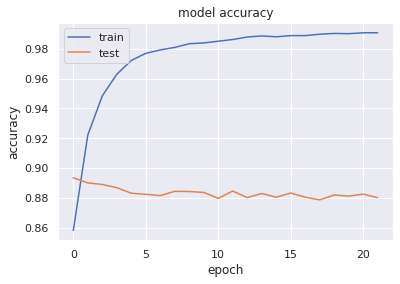

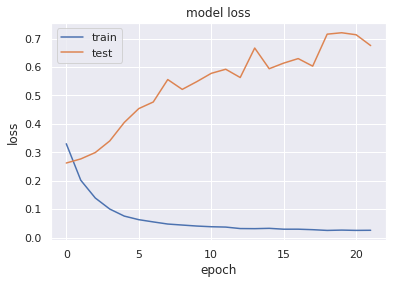

In [27]:
#Let's plot training history of our model

# list all data in history
print(results.history.keys())
# summarize history for accuracy
plt.plot(results.history['accuracy'])
plt.plot(results.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [28]:
model.predict(X_test)

array([[3.6449832e-01],
       [1.0000000e+00],
       [9.8202288e-01],
       ...,
       [6.7494372e-13],
       [4.6324730e-04],
       [1.0000000e+00]], dtype=float32)

In [29]:
X_test.shape[1]

10000

In [30]:
X_test.shape

(15000, 10000)

In [31]:
model.predict(X_test[0].reshape(1,X_test.shape[1]))

array([[0.36449844]], dtype=float32)

In [32]:
print(np.argmax(model.predict(X_test[0].reshape(1,X_test.shape[1]))))

0


In [33]:
if(np.argmax(model.predict(X_test[0].reshape(1,X_test.shape[1]))) == 0):
  print("negative")
elif (np.argmax(model.predict(X_test[0].reshape(1,X_test.shape[1]))) == 1):
  print("positive")

negative


# PART TWO

## Domain:
Social media analytics

## Context:
Past studies in Sarcasm Detection mostly make use of Twitter datasets collected
using hashtag based supervision but such datasets are noisy in terms of labels and language. Furthermore, many tweets are replies to other tweets and detecting sarcasm in these requires the availability of contextual tweets.In this hands-on project, the goal is to build a model to detect whether a sentence is sarcastic or not, using Bidirectional LSTMs.

## Data Description:
The dataset is collected from two news websites, theonion.com and huffingtonpost.com. This new dataset has the following advantages over the existing Twitter datasets: 
Since news headlines are written by professionals in a formal manner, there are no spelling mistakes and informal usage. This reduces the sparsity and also increases the chance of finding pre-trained embeddings. Furthermore, since the sole purpose of TheOnion is to publish sarcastic news, we get high-quality labels with much less noise as compared to Twitter datasets.
Unlike tweets that reply to other tweets, the news headlines obtained are self-contained. This would help us in teasing apart the real sarcastic elements
Content: Each record consists of three attributes:
is_sarcastic: 1 if the record is sarcastic otherwise 0 
headline: the headline of the news article
article_link: link to the original news article. Useful in collecting supplementary data
Reference: https://github.com/rishabhmisra/News-Headlines-Dataset-For-Sarcasm-Detection

## Project Objective:
Build a sequential NLP classifier which can use input text parameters
to determine the customer sentiments.

# Social media analytics

## 1. Read and explore the data

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [35]:
cd "/content/drive/MyDrive/AIML"

/content/drive/MyDrive/AIML


In [36]:
project_path = '/content/drive/MyDrive/AIML/'

In [37]:
!pip install textpreprocess
# Import packages
import warnings; warnings.filterwarnings('ignore')
import pandas as pd, numpy as np, tensorflow as tf
import matplotlib.pyplot as plt, seaborn as sns
import matplotlib.style as style

import random, re
assert tf.__version__ >= '2.0'
%matplotlib inline

from textpreprocess import *
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Input, LSTM, Embedding, Dropout, Activation, Flatten, Bidirectional, GlobalMaxPool1D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.initializers import Constant

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Set random state
random_state = 42
np.random.seed(random_state)
tf.random.set_seed(random_state)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for textpreprocess: filename=textpreprocess-0.1-py3-none-any.whl size=2421 sha256=43bd87497aae3764c945ad7618d99e989762f75ebff7582d88017068f1ba1ea1
  Stored in directory: /root/.cache/pip/wheels/58/47/16/d7109e311c75b8dfa5da3f0a38e694debf887ae7d4761f317e
Successfully built textpreprocess


In [38]:
filepath = project_path + "Sarcasm_Headlines_Dataset.json"

In [39]:
data = pd.read_json(filepath, lines = True)
print(f'Data has {data.shape[0]} rows and {data.shape[1]} columns. Here are the first five rows of the data...')
display(data.head())

Data has 28619 rows and 3 columns. Here are the first five rows of the data...


,is_sarcastic,headline,article_link
0,1,thirtysomething scientists unveil doomsday clo...,https://www.theonion.com/thirtysomething-scien...
1,0,dem rep. totally nails why congress is falling...,https://www.huffingtonpost.com/entry/donna-edw...
2,0,eat your veggies: 9 deliciously different recipes,https://www.huffingtonpost.com/entry/eat-your-...
3,1,inclement weather prevents liar from getting t...,https://local.theonion.com/inclement-weather-p...
4,1,mother comes pretty close to using word 'strea...,https://www.theonion.com/mother-comes-pretty-c...


In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28619 entries, 0 to 28618
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   is_sarcastic  28619 non-null  int64 
 1   headline      28619 non-null  object
 2   article_link  28619 non-null  object
dtypes: int64(1), object(2)
memory usage: 670.9+ KB


In [41]:
data.isnull().sum()

is_sarcastic    0
headline        0
article_link    0
dtype: int64

Value Counts for `is_sarcastic` label
Is Sarcastic count: 13634 i.e. 48.0%
Isn't Sarcastic count: 14985 i.e. 52.0%
Distributon of `is_sarcastic` label


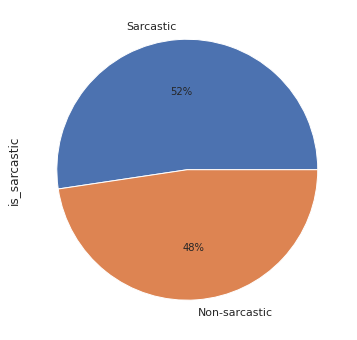

In [42]:
print('Value Counts for `is_sarcastic` label')
print(f'Is Sarcastic count: {data[data.is_sarcastic == 1].shape[0]} i.e. {round(data[data.is_sarcastic == 1].shape[0]/data.shape[0]*100, 0)}%')
print(f'Isn\'t Sarcastic count: {data[data.is_sarcastic == 0].shape[0]} i.e. {round(data[data.is_sarcastic == 0].shape[0]/data.shape[0]*100, 0)}%')

print('Distributon of `is_sarcastic` label')
_ = data['is_sarcastic'].value_counts().plot(kind = 'pie', autopct = '%.0f%%', labels = ['Sarcastic', 'Non-sarcastic'], figsize = (10, 6))

In [43]:
print('Analysis of `is_sarcastic` label by news website')

hf = data[data['article_link'].str.contains('huffingtonpost.com')].shape[0]
op = data[data['article_link'].str.contains('theonion.com')].shape[0]

is_sarcastic_hf = data.loc[(data['article_link'].str.contains('huffingtonpost.com')) & (data['is_sarcastic'] == 1)].shape[0]
not_sarcastic_hf = data.loc[(data['article_link'].str.contains('huffingtonpost.com')) & (data['is_sarcastic'] == 0)].shape[0]

is_sarcastic_op = data.loc[(data['article_link'].str.contains('theonion.com')) & (data['is_sarcastic'] == 1)].shape[0]
not_sarcastic_op = data.loc[(data['article_link'].str.contains('theonion.com')) & (data['is_sarcastic'] == 0)].shape[0]

display(pd.DataFrame([[is_sarcastic_hf, is_sarcastic_op], [not_sarcastic_hf, not_sarcastic_op]], 
                     columns = ['huffingtonpost', 'theonion'], index = ['Sarcastic', 'Non-sarcastic']))

Analysis of `is_sarcastic` label by news website


,huffingtonpost,theonion
Sarcastic,0,13634
Non-sarcastic,14985,1


In [44]:
df_sarcastic = data.is_sarcastic.value_counts().to_frame()
df_sarcastic

,is_sarcastic
0,14985
1,13634


(array([0, 1]), <a list of 2 Text major ticklabel objects>)

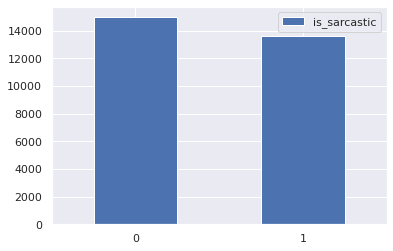

In [45]:
import matplotlib.pyplot as plt
%matplotlib inline
df_sarcastic.plot(kind = 'bar')
plt.xticks(rotation = 0)

In [46]:
sarcastic_headlines = data.loc[data['is_sarcastic'] == 1]

non_sarcastic_headlines = data.loc[data['is_sarcastic'] == 0]

In [47]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [48]:
text = ' '.join(review for review in sarcastic_headlines.headline)
print ('There are {} words in the combination of all review.'.format(len(text)))

There are 904356 words in the combination of all review.


**Word cloud of Sarcastic Headlines**

(-0.5, 399.5, 199.5, -0.5)

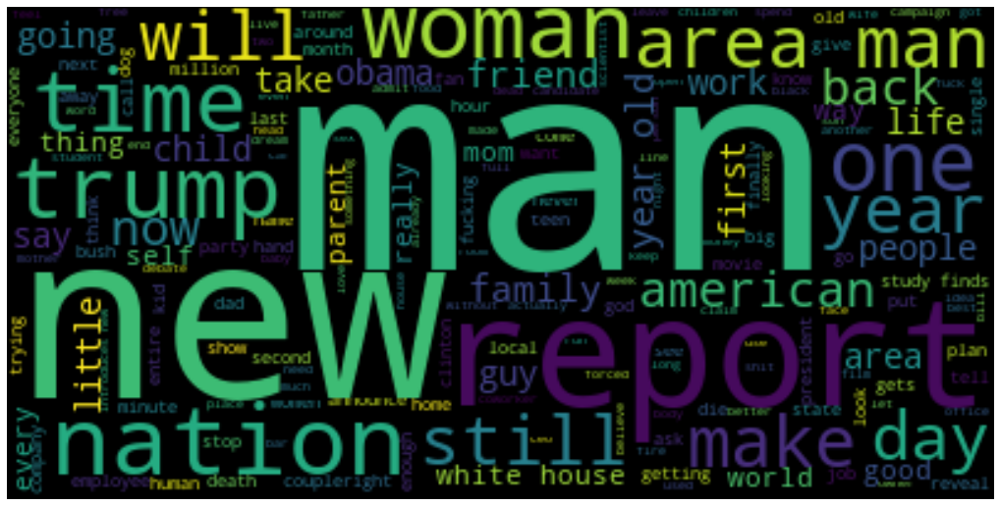

In [49]:
stopwords = set(STOPWORDS)

# Generate a word cloud image
wordcloud = WordCloud(stopwords = stopwords, background_color = "black").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize = [18, 18])
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis("off")

In [50]:
text_ns = ' '.join(review for review in non_sarcastic_headlines.headline)
print ('There are {} words in the combination of all review.'.format(len(text_ns)))

There are 907470 words in the combination of all review.


**Word cloud of Non Sarcastic Headlines**

In [51]:
text_ns = ' '.join(review for review in non_sarcastic_headlines.headline)
print ('There are {} words in the combination of all review.'.format(len(text_ns)))

There are 907470 words in the combination of all review.


(-0.5, 399.5, 199.5, -0.5)

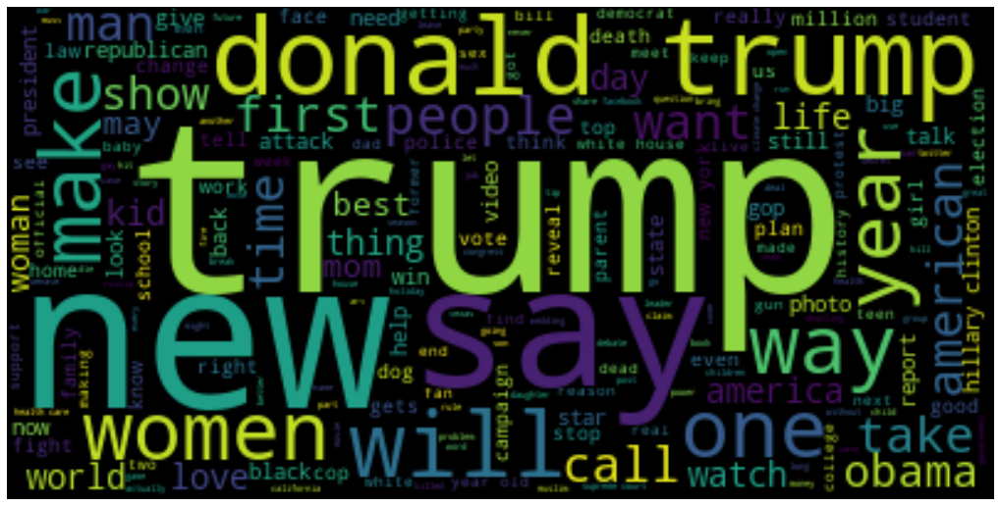

In [52]:
stopwords = set(STOPWORDS)

# Generate a word cloud image
wordcloud = WordCloud(stopwords = stopwords, background_color = "black").generate(text_ns)

# Display the generated image:
plt.figure(figsize = [18, 18])
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis("off")

In [53]:
data = pd.concat([sarcastic_headlines, non_sarcastic_headlines])

## 2. Retain relevant columns

In [54]:
data = data.drop(columns = 'article_link', axis = 1)
data.head()

,is_sarcastic,headline
0,1,thirtysomething scientists unveil doomsday clo...
3,1,inclement weather prevents liar from getting t...
4,1,mother comes pretty close to using word 'strea...
7,1,richard branson's global-warming donation near...
8,1,shadow government getting too large to meet in...


## 3. Get length of each sentence

In [55]:
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

In [56]:
def clean_text(text, remove_stopwords=True):
  # Convert words to lower case
  text = text.lower()
  if True:
    text = text.split()
    new_text = []
    for word in text:
      if word in contractions:
        new_text.append(contractions[word])
      else:
        new_text.append(word)
      text = " ".join(new_text)
      text = re.sub(r'https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
      text = re.sub(r'\<a href', ' ', text)
      text = re.sub(r'&amp;', '', text)
      text = re.sub(r'[_"\-;%()|+&=*%.,!?:#$@\[\]/]', ' ', text)
      text = re.sub(r'<br />', ' ', text)
      text = re.sub(r'\'', ' ', text)
      if remove_stopwords:
        text = text.split()
        stops = set(stopwords.words("english"))
        text = [w for w in text if not w in stops]
        text = " ".join(text)
  return text

In [57]:
import nltk
nltk.download('stopwords')

# Clean the headlines
import re
from nltk.corpus import stopwords 
from pickle import dump, load

clean_balanced_headlines = []
for headline in data['headline']:
  clean_balanced_headlines.append(clean_text(headline, remove_stopwords = False))
print('Data is cleaned!')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
Data is cleaned!


In [58]:
data['cleaned_headline'] = clean_balanced_headlines
data.head()

,is_sarcastic,headline,cleaned_headline
0,1,thirtysomething scientists unveil doomsday clo...,thirtysomething scientists unveil doomsday clo...
3,1,inclement weather prevents liar from getting t...,inclement weather prevents liar from getting t...
4,1,mother comes pretty close to using word 'strea...,mother comes pretty close to using word strea...
7,1,richard branson's global-warming donation near...,richard branson s global warming donation near...
8,1,shadow government getting too large to meet in...,shadow government getting too large to meet in...


In [59]:
data = data.drop('headline', axis = 1)
data.head()

,is_sarcastic,cleaned_headline
0,1,thirtysomething scientists unveil doomsday clo...
3,1,inclement weather prevents liar from getting t...
4,1,mother comes pretty close to using word strea...
7,1,richard branson s global warming donation near...
8,1,shadow government getting too large to meet in...


In [60]:
print (data['cleaned_headline'][7])

richard branson s global warming donation nearly as much as cost of failed balloon trips


In [61]:
len(data['cleaned_headline'][7].split())

15

In [62]:
max_length = max([len(headline.split()) for headline in data['cleaned_headline']])
print('Maximum Length: ', max_length)

Maximum Length:  152


In [63]:
data['Length_of_headline']=[len(headline.split()) for headline in data['cleaned_headline']]

In [64]:
data

,is_sarcastic,cleaned_headline,Length_of_headline
0,1,thirtysomething scientists unveil doomsday clo...,8
3,1,inclement weather prevents liar from getting t...,8
4,1,mother comes pretty close to using word strea...,9
7,1,richard branson s global warming donation near...,15
8,1,shadow government getting too large to meet in...,12
...,...,...,...
28607,0,what our grieving family needs from loved ones...,11
28608,0,stephen colbert attempts to list everything tr...,12
28609,0,bakery owner vows to stop making wedding cakes...,14
28613,0,how san antonio s dominant defense is fueling ...,10


In [65]:
print (data['cleaned_headline'][0])

thirtysomething scientists unveil doomsday clock of hair loss


## 4. Define parameters

In [66]:
max_features = 10000
maxlen = max_length
embedding_size = 200

## 5. Get indices for words

In [67]:
tokenizer = Tokenizer(num_words = max_features)
tokenizer.fit_on_texts(data['cleaned_headline'])

In [68]:
word_index = tokenizer.word_index

In [69]:
print(word_index)

{'to': 1, 'of': 2, 'the': 3, 's': 4, 'in': 5, 'for': 6, 'a': 7, 'on': 8, 'is': 9, 'and': 10, 'with': 11, 'trump': 12, 'not': 13, 'new': 14, 'man': 15, 'it': 16, 'has': 17, 'at': 18, 'from': 19, 'you': 20, 'he': 21, 'about': 22, 'by': 23, 'after': 24, 'this': 25, 'that': 26, 'out': 27, 'up': 28, 'be': 29, 'are': 30, 'as': 31, 'how': 32, 'will': 33, 'what': 34, 'who': 35, 'his': 36, 'just': 37, 'your': 38, 'all': 39, 'have': 40, 'report': 41, 'more': 42, 'into': 43, 'year': 44, 'one': 45, 'woman': 46, 'over': 47, 'i': 48, 'day': 49, 'why': 50, 'u': 51, 'area': 52, 'can': 53, 'time': 54, 'says': 55, 'donald': 56, 'first': 57, 'do': 58, 'no': 59, 'like': 60, 'get': 61, 'her': 62, 'people': 63, 'she': 64, 'obama': 65, 'old': 66, 'off': 67, 'they': 68, 'women': 69, 'nation': 70, 'life': 71, 'world': 72, 'now': 73, 'house': 74, 'we': 75, 'an': 76, 'white': 77, 'still': 78, 'was': 79, 'back': 80, 'make': 81, 'would': 82, 'than': 83, 'down': 84, 'could': 85, 'clinton': 86, 'if': 87, 'my': 88, '

## 6. Create features and labels

In [70]:
X = tokenizer.texts_to_sequences(data['cleaned_headline'])
X = pad_sequences(X, maxlen = maxlen)
y = np.asarray(data['is_sarcastic'])

print("Number of Samples:", len(X))
print(X[0])
print("Number of Labels: ", len(y))
print(y[0])

Number of Samples: 28619
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0  359 3198 6352 2176    2  651 1142]
Number of Labels:  28619
1


## 7. Get vocabulary size

In [71]:
vocab_size = len(word_index) + 1
print('Vocabulary Size: ', vocab_size)

Vocabulary Size:  26423


## 8. Create a weight matrix using GloVe embeddings

**Get Glove Word Embeddings**

In [72]:
glove_file = project_path + "glove.6B.zip"

In [73]:
#Extract Glove embedding zip file
from zipfile import ZipFile
with ZipFile(glove_file, 'r') as z:
  z.extractall()

**Get the Word Embeddings using Embedding file as given below.**

In [74]:
EMBEDDING_FILE = './glove.6B.200d.txt'

embeddings = {}
for o in open(EMBEDDING_FILE):
    word = o.split(" ")[0]
    # print(word)
    embd = o.split(" ")[1:]
    embd = np.asarray(embd, dtype='float32')
    # print(embd)
    embeddings[word] = embd

**Create a weight matrix for words in training docs**

In [75]:
# Getting the minimum number of words
num_words = min(max_features, vocab_size) + 1
embedding_matrix = np.zeros((num_words, embedding_size))
for word, i in word_index.items():
    if i > max_features: continue
    embedding_vector = embeddings.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

len(embeddings.values())

400000

## 9. Define and compile a Bidirectional LSTM model.

In [76]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = random_state, shuffle = True)

print(f'\nNumber of rows in training dataset: {x_train.shape[0]}')
print(f'Number of columns in training dataset: {x_train.shape[1]}')
print(f'Number of unique words in training dataset: {len(np.unique(np.hstack(x_train)))}')

print(f'\nNumber of rows in test dataset: {x_test.shape[0]}')
print(f'Number of columns in test dataset: {x_test.shape[1]}')
print(f'Number of unique words in test dataset: {len(np.unique(np.hstack(x_test)))}')


Number of rows in training dataset: 22895
Number of columns in training dataset: 152
Number of unique words in training dataset: 9987

Number of rows in test dataset: 5724
Number of columns in test dataset: 152
Number of unique words in test dataset: 7880


In [77]:
model = Sequential()
model.add(Embedding(num_words, embedding_size, embeddings_initializer = Constant(embedding_matrix), input_length = maxlen, trainable = False))
model.add(Bidirectional(LSTM(128, return_sequences = True)))
model.add(GlobalMaxPool1D())
model.add(Dropout(0.5, input_shape = (256,)))
model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.5, input_shape = (128,)))
model.add(Dense(64, activation = 'relu'))
model.add(Dropout(0.5, input_shape = (64,)))
model.add(Dense(1, activation = 'sigmoid'))

model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

# Adding callbacks
es = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 10)  
mc = ModelCheckpoint('sarcasm_detector.h5', monitor = 'val_loss', mode = 'min', save_best_only = True, verbose = 1)
lr_r = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 5),
logdir = 'log'; tb = TensorBoard(logdir, histogram_freq = 1)
callbacks = [es, mc, lr_r, tb]

print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 152, 200)          2000200   
                                                                 
 bidirectional (Bidirectiona  (None, 152, 256)         336896    
 l)                                                              
                                                                 
 global_max_pooling1d (Globa  (None, 256)              0         
 lMaxPooling1D)                                                  
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_4 (Dense)             (None, 128)               32896     
                                                                 
 dropout_3 (Dropout)         (None, 128)              

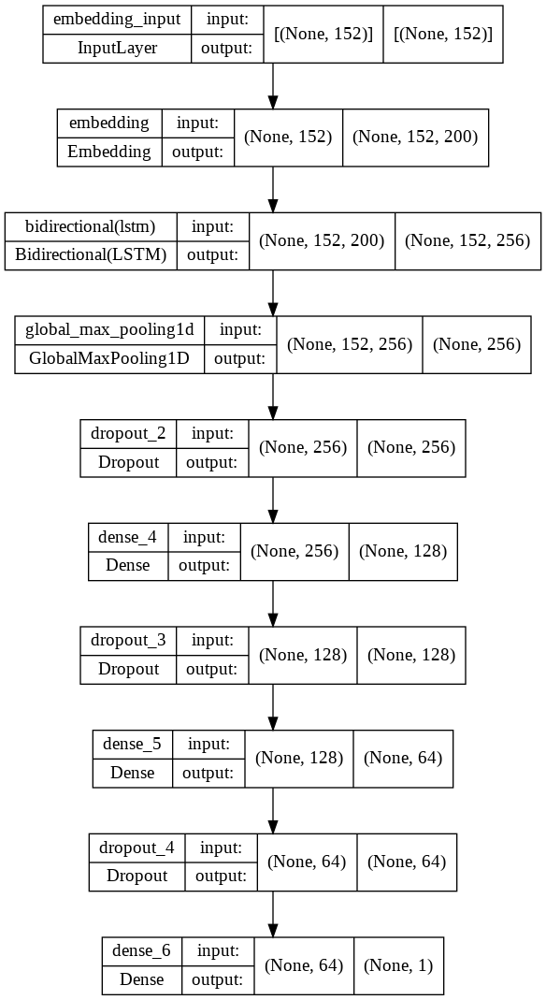

In [78]:
tf.keras.utils.plot_model(model, show_shapes = True)

## 10. Fit the model and check the validation accuracy

In [79]:
batch_size = 100
epochs = 6

h = model.fit(x_train, y_train, epochs = epochs, validation_split = 0.2, batch_size = batch_size, verbose = 2, callbacks = callbacks)

Epoch 1/6

Epoch 1: val_loss improved from inf to 0.49004, saving model to sarcasm_detector.h5
184/184 - 173s - loss: 0.6009 - accuracy: 0.6612 - val_loss: 0.4900 - val_accuracy: 0.7602 - lr: 0.0010 - 173s/epoch - 942ms/step
Epoch 2/6

Epoch 2: val_loss improved from 0.49004 to 0.37426, saving model to sarcasm_detector.h5
184/184 - 175s - loss: 0.4352 - accuracy: 0.8072 - val_loss: 0.3743 - val_accuracy: 0.8375 - lr: 0.0010 - 175s/epoch - 951ms/step
Epoch 3/6

Epoch 3: val_loss improved from 0.37426 to 0.34361, saving model to sarcasm_detector.h5
184/184 - 165s - loss: 0.3727 - accuracy: 0.8393 - val_loss: 0.3436 - val_accuracy: 0.8532 - lr: 0.0010 - 165s/epoch - 897ms/step
Epoch 4/6

Epoch 4: val_loss improved from 0.34361 to 0.32222, saving model to sarcasm_detector.h5
184/184 - 174s - loss: 0.3314 - accuracy: 0.8600 - val_loss: 0.3222 - val_accuracy: 0.8607 - lr: 0.0010 - 174s/epoch - 944ms/step
Epoch 5/6

Epoch 5: val_loss improved from 0.32222 to 0.31192, saving model to sarcasm_d

In [80]:
%load_ext tensorboard
%tensorboard --logdir log/

<IPython.core.display.Javascript object>

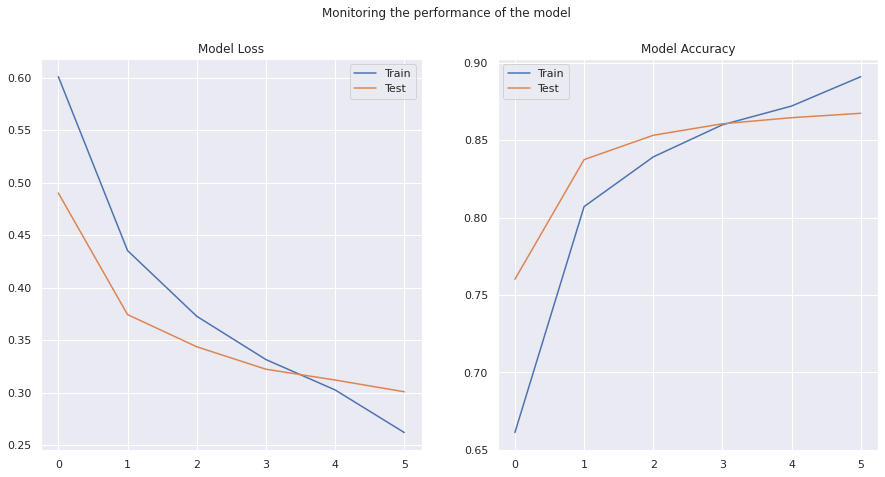

In [81]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 7.2))
f.suptitle('Monitoring the performance of the model')

ax1.plot(h.history['loss'], label = 'Train')
ax1.plot(h.history['val_loss'], label = 'Test')
ax1.set_title('Model Loss')
ax1.legend(['Train', 'Test'])

ax2.plot(h.history['accuracy'], label = 'Train')
ax2.plot(h.history['val_accuracy'], label = 'Test')
ax2.set_title('Model Accuracy')
ax2.legend(['Train', 'Test'])

plt.show()

In [82]:
# Evaluate the model
loss, accuracy = model.evaluate(x_test, y_test, verbose = 0)
print('Overall Accuracy: {}'.format(round(accuracy * 100, 0)))

Overall Accuracy: 86.0


In [83]:
y_pred = (model.predict(x_test) > 0.5).astype('int32')
print(f'Classification Report:\n{classification_report(y_pred, y_test)}')

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.87      0.87      2976
           1       0.86      0.86      0.86      2748

    accuracy                           0.86      5724
   macro avg       0.86      0.86      0.86      5724
weighted avg       0.86      0.86      0.86      5724



Confusion Matrix


,Non-sarcastic,Sarcastic
Non-sarcastic,2592,397
Sarcastic,384,2351


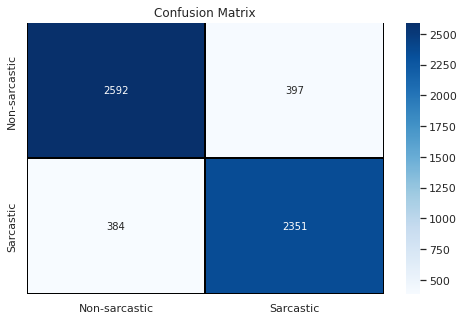

In [84]:
print('Confusion Matrix')
cm = confusion_matrix(y_test, y_pred)
cm = pd.DataFrame(cm , index = ['Non-sarcastic', 'Sarcastic'] , columns = ['Non-sarcastic','Sarcastic'])
display(cm)

plt.figure(figsize = (8, 5))
_ = sns.heatmap(cm, cmap= 'Blues', linecolor = 'black' , linewidth = 1 , annot = True, 
            fmt = '' , xticklabels = ['Non-sarcastic', 'Sarcastic'], 
            yticklabels = ['Non-sarcastic', 'Sarcastic']).set_title('Confusion Matrix')